In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, scale, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import roc_auc_score, roc_curve

import matplotlib.pyplot as plt
plt.style.use("ggplot")
from warnings import filterwarnings
filterwarnings('ignore')


In [2]:
df = pd.read_csv('utils/mini_data.csv')
df.head()

,ts,device,co,humidity,light,lpg,motion,smoke,temp
0,1.594512e+09,b8:27:eb:bf:9d:51,0.004956,51.000000,False,0.007651,False,0.020411,22.700000
1,1.594512e+09,00:0f:00:70:91:0a,0.002840,76.000000,False,0.005114,False,0.013275,19.700001
2,1.594512e+09,b8:27:eb:bf:9d:51,0.004976,50.900000,False,0.007673,False,0.020475,22.600000
3,1.594512e+09,1c:bf:ce:15:ec:4d,0.004403,76.800003,True,0.007023,False,0.018628,27.000000
4,1.594512e+09,b8:27:eb:bf:9d:51,0.004967,50.900000,False,0.007664,False,0.020448,22.600000


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2099 entries, 0 to 2098
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   ts        2099 non-null   float64
 1   device    2099 non-null   object 
 2   co        2099 non-null   float64
 3   humidity  2099 non-null   float64
 4   light     2099 non-null   bool   
 5   lpg       2099 non-null   float64
 6   motion    2099 non-null   bool   
 7   smoke     2099 non-null   float64
 8   temp      2099 non-null   float64
dtypes: bool(2), float64(6), object(1)
memory usage: 119.0+ KB


In [4]:
df['ts'] = df['ts'].astype(dtype=str)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2099 entries, 0 to 2098
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   ts        2099 non-null   object 
 1   device    2099 non-null   object 
 2   co        2099 non-null   float64
 3   humidity  2099 non-null   float64
 4   light     2099 non-null   bool   
 5   lpg       2099 non-null   float64
 6   motion    2099 non-null   bool   
 7   smoke     2099 non-null   float64
 8   temp      2099 non-null   float64
dtypes: bool(2), float64(5), object(2)
memory usage: 119.0+ KB


In [6]:
df.head()

,ts,device,co,humidity,light,lpg,motion,smoke,temp
0,1594512094.3859746,b8:27:eb:bf:9d:51,0.004956,51.000000,False,0.007651,False,0.020411,22.700000
1,1594512094.7355676,00:0f:00:70:91:0a,0.002840,76.000000,False,0.005114,False,0.013275,19.700001
2,1594512098.0735729,b8:27:eb:bf:9d:51,0.004976,50.900000,False,0.007673,False,0.020475,22.600000
3,1594512099.589146,1c:bf:ce:15:ec:4d,0.004403,76.800003,True,0.007023,False,0.018628,27.000000
4,1594512101.761235,b8:27:eb:bf:9d:51,0.004967,50.900000,False,0.007664,False,0.020448,22.600000


In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
co,2099.0,0.004188,0.000965,0.002528,0.002840,0.004383,0.005013,0.005120
humidity,2099.0,64.865841,13.078835,48.700000,51.100000,74.900002,77.599998,79.300003
lpg,2099.0,0.006734,0.001164,0.004701,0.005114,0.007000,0.007715,0.007833
smoke,2099.0,0.017831,0.003272,0.012133,0.013275,0.018563,0.020594,0.020931
temp,2099.0,22.880705,2.806280,1.300000,19.799999,22.500000,26.799999,27.100000


In [8]:
df.isnull().sum()

ts          0
device      0
co          0
humidity    0
light       0
lpg         0
motion      0
smoke       0
temp        0
dtype: int64

In [17]:
df['motion'].unique()

array([False])

In [18]:
numerical_light = []
numerical_motion = []
for light, motion in zip(df['light'], df['motion']):
    if light == True:
        numerical_light.append(1)
    else:
        numerical_light.append(0)

    if motion == True:
        numerical_motion.append(1)
    else:
        numerical_motion.append(0)

In [19]:
df['numerical_light'] = numerical_light
df['numerical_motion'] = numerical_motion

In [20]:
df.head()

,ts,device,co,humidity,light,lpg,motion,smoke,temp,numerical_light,numerical_motion
0,1594512094.3859746,b8:27:eb:bf:9d:51,0.004956,51.000000,False,0.007651,False,0.020411,22.700000,0,0
1,1594512094.7355676,00:0f:00:70:91:0a,0.002840,76.000000,False,0.005114,False,0.013275,19.700001,0,0
2,1594512098.0735729,b8:27:eb:bf:9d:51,0.004976,50.900000,False,0.007673,False,0.020475,22.600000,0,0
3,1594512099.589146,1c:bf:ce:15:ec:4d,0.004403,76.800003,True,0.007023,False,0.018628,27.000000,1,0
4,1594512101.761235,b8:27:eb:bf:9d:51,0.004967,50.900000,False,0.007664,False,0.020448,22.600000,0,0


In [28]:
numerical_columns = []
for col in df.columns:
    if df[col].dtype == 'float64' or df[col].dtype == 'int64':
        numerical_columns.append(col)

In [29]:
numerical_columns

['co',
 'humidity',
 'lpg',
 'smoke',
 'temp',
 'numerical_light',
 'numerical_motion']

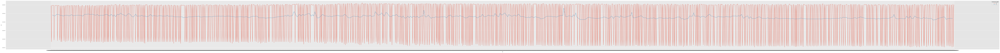

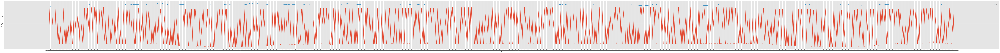

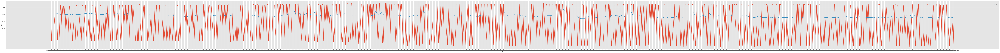

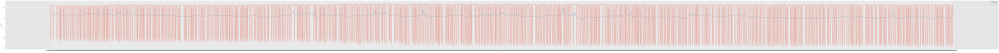

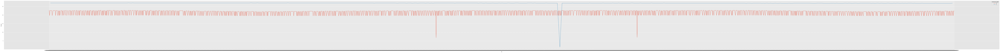

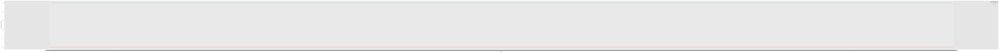

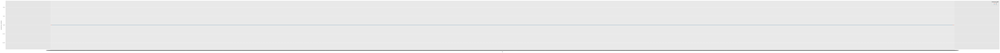

In [30]:
for col in numerical_columns:
    plt.figure(figsize=(200, 10))
    sns.lineplot(data=df, x='ts', y=col, hue='numerical_light')
    sns.lineplot()
